## Creación archivo SIMLIB


Este notebook fue creado para generar archivos SIMLIB a partir de las [simulaciones de estrategia de observación de LSST](https://survey-strategy.lsst.io/index.html#), que es necesario para ejecutar simulaciones en SNANA. El código fue adaptado de la librería [OpSimSumV2](https://opsimsummaryv2.readthedocs.io/en/latest/basicusage.html).

In [ ]:
!git clone https://github.com/bastiencarreres/OpSimSummaryV2.git
%cd OpSimSummaryV2
!pip install .

Cloning into 'OpSimSummaryV2'...
remote: Enumerating objects: 492, done.
remote: Counting objects: 100% (87/87), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 492 (delta 55), reused 61 (delta 38), pack-reused 405 (from 1)
Receiving objects: 100% (492/492), 1.07 MiB | 3.63 MiB/s, done.
Resolving deltas: 100% (293/293), done.
/content/OpSimSummaryV2
Processing /content/OpSimSummaryV2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 28.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 21.4 MB/s eta 0:00:00
  Created wheel for opsimsummaryv2: filename=opsimsummaryv2-0.1-py3-none-any.whl size=16569 sha256=1a2ff178f0af26c89b4b4ce087b504b51ba997ac3464bef821b8874617e998ab
  Stored in directory: /tmp/pip-ephem-wheel-cache-r5ivtns3/wheels/73/f5/fa/61e6a10f161d307a30b5046aee6dc9e761664dc89fa896f999
Successfully built opsims

In [ ]:
!pip install rubin_sim

  Using cached rubin_sim-2.3.0-py3-none-any.whl.metadata (4.2 kB)
  Using cached astroplan-0.10.1.tar.gz (140 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.0/43.0 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.7/815.7 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 416.8/416.8 kB 30.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.0/367.0 kB 27.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.7/235.7 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.5/156.5 kB 12.2 MB/s eta 0:00:00
  Created wheel for astroplan: fil

In [ ]:
import opsimsummaryv2 as opsim
import os
import numpy as np
from astropy.time import Time
from sklearn.neighbors import BallTree
import healpy as hp
import time
import datetime
import pandas as pd
from opsimsummaryv2 import utils as ut
import matplotlib
import matplotlib.pyplot as plt
import rubin_sim.maf as maf

Primero abrimos el archivo 'baseline_v5.0.1_10yrs.db' (o su versión más reciente,

---

buscar [aquí](https://s3df.slac.stanford.edu/data/rubin/sim-data/)). Este archivo contiene el plan de observaciones, que consiste en una simulación de 10 años de observaciones.

In [ ]:
!wget https://s3df.slac.stanford.edu/data/rubin/sim-data/sims_featureScheduler_runs5.0/baseline/baseline_v5.0.0_10yrs.db

--2025-10-06 16:56:16--  https://s3df.slac.stanford.edu/data/rubin/sim-data/sims_featureScheduler_runs5.0/baseline/baseline_v5.0.0_10yrs.db
Resolving s3df.slac.stanford.edu (s3df.slac.stanford.edu)... 134.79.138.139
Connecting to s3df.slac.stanford.edu (s3df.slac.stanford.edu)|134.79.138.139|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 762941440 (728M) [application/octet-stream]
Saving to: ‘baseline_v5.0.0_10yrs.db.1’

baseline_v5.0.0_10y 100%[===================>] 727.60M   437KB/s    in 15m 44s 

2025-10-06 17:12:02 (789 KB/s) - ‘baseline_v5.0.0_10yrs.db.1’ saved [762941440/762941440]



In [ ]:
OpSimSurv = opsim.OpSimSurvey('/content/baseline_v5.0.0_10yrs.db.1')

Reading from database sqlite:////content/baseline_v5.0.0_10yrs.db.1
Read N = 2048612 observations in 56.93 seconds.
No host file.


Podemos generar un gráfico que muestre las zonas del cielo que se observarán. Las zonas en amarillo corresponden a los DDF.

Finished compute healpy representation, total number of fields : 342729.


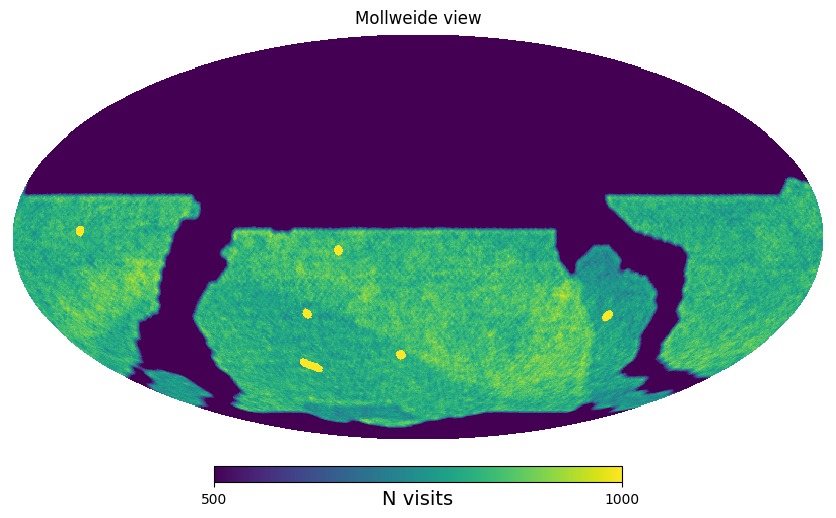

In [ ]:
# Compute the healpy representation of the survey
# with a cut to a minimum of 500 and a maximum of 10000 visits
OpSimSurv.compute_hp_rep(nside=240)

# Plot the healpy configuration
fig = OpSimSurv.plot_hp_rep(min=500, max=1000)

In [ ]:
OpSimSurv

In [ ]:
df = OpSimSurv.opsimdf
df

,fieldRA,fieldDec,observationStartMJD,flush_by_mjd,visitExposureTime,band,filter,rotSkyPos,rotSkyPos_desired,numExposures,...,moonDistance,solarElong,moonPhase,cummTelAz,observation_reason,science_program,cloud_extinction,_ra,_dec,field_type
observationId,,,,,,,,,,,,,,,,,,,,,
0,261.567911,-27.431786,60980.001626,60980.02490,15.0,r,r,336.671299,0.0,1,...,74.272993,44.199760,65.730372,-105.779024,pairs_i_5.0,None,0.0,4.565221,-0.478775,twilight_near_sun
1,262.851107,-22.591159,60980.001877,60980.02490,15.0,r,r,339.138048,0.0,1,...,73.388864,44.943838,65.731465,-100.078820,pairs_i_5.0,None,0.0,4.587617,-0.394290,twilight_near_sun
2,261.834513,-19.886311,60980.002123,60980.02490,15.0,r,r,340.673287,0.0,1,...,74.537327,43.949916,65.732536,-97.689502,pairs_i_5.0,None,0.0,4.569874,-0.347082,twilight_near_sun
3,260.885516,-17.164857,60980.002369,60980.02490,15.0,r,r,342.034908,0.0,1,...,75.688202,43.121464,65.733607,-95.361047,pairs_i_5.0,None,0.0,4.553311,-0.299583,twilight_near_sun
4,262.197819,-12.138795,60980.002619,60980.02490,15.0,r,r,344.082520,0.0,1,...,74.981544,44.870040,65.734698,-89.776300,pairs_i_5.0,None,0.0,4.576215,-0.211862,twilight_near_sun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2048607,70.400259,-72.260546,64632.270857,64632.32233,38.0,u,u,296.294115,0.0,1,...,93.999795,90.518505,8.039063,-174.093535,pairs_ug_33.0,None,0.0,1.228716,-1.261184,WFD
2048608,60.692490,-76.403093,64632.271382,64632.32233,38.0,u,u,308.438959,0.0,1,...,90.662758,88.158308,8.043509,-170.539405,pairs_ug_33.0,None,0.0,1.059284,-1.333486,WFD
2048609,71.299640,-75.257240,64632.271893,64632.32233,38.0,u,u,295.879323,0.0,1,...,91.092793,87.889337,8.047836,-174.114775,pairs_ug_33.0,None,0.0,1.244413,-1.313487,WFD


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2048612 entries, 0 to 2048611
Data columns (total 49 columns):
 #   Column               Dtype  
---  ------               -----  
 0   fieldRA              float64
 1   fieldDec             float64
 2   observationStartMJD  float64
 3   flush_by_mjd         float64
 4   visitExposureTime    float64
 5   band                 object 
 6   filter               object 
 7   rotSkyPos            float64
 8   rotSkyPos_desired    float64
 9   numExposures         int64  
 10  airmass              float64
 11  seeingFwhm500        float64
 12  seeingFwhmEff        float64
 13  seeingFwhmGeom       float64
 14  skyBrightness        float64
 15  night                int64  
 16  slewTime             float64
 17  visitTime            float64
 18  slewDistance         float64
 19  fiveSigmaDepth       float64
 20  altitude             float64
 21  azimuth              float64
 22  paraAngle            float64
 23  pseudoParaAngle      float64
 24  clo

In [ ]:
import pandas as pd
# Set display options to show all unique values
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

# Convert the unique values to a pandas Series before printing
print(pd.Series(df.scheduler_note.unique()))

# Reset display options to default
pd.reset_option('display.max_rows')
pd.reset_option('display.max_columns')
pd.reset_option('display.max_colwidth')

0                        twilight_near_sun, 0
1                        twilight_near_sun, 1
2                        twilight_near_sun, 2
3                        twilight_near_sun, 3
4                                      greedy
5                            blob_long, gr, a
6                            blob_long, gr, b
7                              pair_33, gr, a
8                              pair_33, gr, b
9                                     long, 1
10                                    long, 2
11                                    long, 3
12                                    long, 4
13                                    long, 5
14                                    long, 6
15                                    long, 7
16                                    long, 8
17                                    long, 9
18                                   long, 10
19                                   long, 11
20                                   long, 12
21                                

In [ ]:
WFD_list = ['blob_long, gr, a', 'blob_long, gr, b', 'pair_33, ug, a',
       'pair_33, ug, b', 'long', 'pair_15, iz, a', 'pair_15, iz, b',
       'pair_15, ri, a', 'pair_15, ri, b', 'pair_15, zy, a',
       'pair_33, gr, a', 'pair_33, gr, b', 'pair_33, ri, a',
       'pair_33, ri, b', 'pair_15, yy, a', 'pair_15, yy, b',
       'pair_33, iz, a', 'pair_33, iz, b', 'pair_15, zy, b',
       'pair_33, zy, a', 'pair_33, zy, b', 'pair_33, yy, a',
       'pair_33, yy, b', 'blob_long, iz, a', 'blob_long, iz, b',
       'pair_33, ur, a', 'pair_33, ur, b', 'blob_long, ri, a',
       'blob_long, ri, b'] #greedy, twilight_near_sun?
twilight_near_sun_list = ['twilight_near_sun, 0', 'twilight_near_sun, 1', 'twilight_near_sun, 2',
       'twilight_near_sun, 3']

conditions = [(df.scheduler_note.isin(WFD_list)),
              (df.scheduler_note.str.startswith('DD:')), # Modified condition for DD
              (df.scheduler_note.isin(twilight_near_sun_list)),
              (df.scheduler_note =='greedy')
             ]
field_types = ['WFD', 'DD', 'twilight_near_sun', 'greedy']
df['field_type'] = np.select(conditions, field_types)
df

,fieldRA,fieldDec,observationStartMJD,flush_by_mjd,visitExposureTime,band,filter,rotSkyPos,rotSkyPos_desired,numExposures,...,moonDistance,solarElong,moonPhase,cummTelAz,observation_reason,science_program,cloud_extinction,_ra,_dec,field_type
observationId,,,,,,,,,,,,,,,,,,,,,
0,261.567911,-27.431786,60980.001626,60980.02490,15.0,r,r,336.671299,0.0,1,...,74.272993,44.199760,65.730372,-105.779024,pairs_i_5.0,None,0.0,4.565221,-0.478775,twilight_near_sun
1,262.851107,-22.591159,60980.001877,60980.02490,15.0,r,r,339.138048,0.0,1,...,73.388864,44.943838,65.731465,-100.078820,pairs_i_5.0,None,0.0,4.587617,-0.394290,twilight_near_sun
2,261.834513,-19.886311,60980.002123,60980.02490,15.0,r,r,340.673287,0.0,1,...,74.537327,43.949916,65.732536,-97.689502,pairs_i_5.0,None,0.0,4.569874,-0.347082,twilight_near_sun
3,260.885516,-17.164857,60980.002369,60980.02490,15.0,r,r,342.034908,0.0,1,...,75.688202,43.121464,65.733607,-95.361047,pairs_i_5.0,None,0.0,4.553311,-0.299583,twilight_near_sun
4,262.197819,-12.138795,60980.002619,60980.02490,15.0,r,r,344.082520,0.0,1,...,74.981544,44.870040,65.734698,-89.776300,pairs_i_5.0,None,0.0,4.576215,-0.211862,twilight_near_sun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2048607,70.400259,-72.260546,64632.270857,64632.32233,38.0,u,u,296.294115,0.0,1,...,93.999795,90.518505,8.039063,-174.093535,pairs_ug_33.0,None,0.0,1.228716,-1.261184,WFD
2048608,60.692490,-76.403093,64632.271382,64632.32233,38.0,u,u,308.438959,0.0,1,...,90.662758,88.158308,8.043509,-170.539405,pairs_ug_33.0,None,0.0,1.059284,-1.333486,WFD
2048609,71.299640,-75.257240,64632.271893,64632.32233,38.0,u,u,295.879323,0.0,1,...,91.092793,87.889337,8.047836,-174.114775,pairs_ug_33.0,None,0.0,1.244413,-1.313487,WFD


In [ ]:
df.field_type.unique()

array(['twilight_near_sun', 'greedy', 'WFD', '0', 'DD'], dtype=object)

In [ ]:
df_field_type_0 = df[df.field_type == '0']
df_field_type_0

,fieldRA,fieldDec,observationStartMJD,flush_by_mjd,visitExposureTime,band,filter,rotSkyPos,rotSkyPos_desired,numExposures,...,moonDistance,solarElong,moonPhase,cummTelAz,observation_reason,science_program,cloud_extinction,_ra,_dec,field_type
observationId,,,,,,,,,,,,,,,,,,,,,
402,26.236749,-75.736118,60980.309329,60980.373885,30.0,g,g,289.034019,0.0,1,...,72.496436,89.628913,67.438946,-165.296157,triplet_long_gap,None,0.0,0.457918,-1.321845,0
403,36.174642,-77.449496,60980.309747,60980.374309,30.0,g,g,278.053737,0.0,1,...,75.362698,88.129267,67.442149,-168.688925,triplet_long_gap,None,0.0,0.631367,-1.351749,0
404,35.819725,-80.610947,60980.310167,60980.374727,30.0,g,g,276.702618,0.0,1,...,77.071668,84.967319,67.445371,-171.746429,triplet_long_gap,None,0.0,0.625172,-1.406926,0
405,35.965945,-83.776534,60980.310587,60980.375147,30.0,g,g,274.986995,0.0,1,...,78.888105,81.801878,67.448595,-174.729448,triplet_long_gap,None,0.0,0.627724,-1.462176,0
406,38.149794,-86.934314,60980.311006,60980.375567,30.0,g,g,271.360607,0.0,1,...,80.800652,78.642696,67.451821,-177.644666,triplet_long_gap,None,0.0,0.665840,-1.517290,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2048345,4.041206,-13.045533,64631.197721,64631.341805,29.2,r,r,79.765726,0.0,1,...,140.311954,139.380262,2.885468,-69.105455,ToO,None,0.0,0.070532,-0.227688,0
2048346,0.415458,-9.438198,64631.198149,64631.364722,29.2,r,r,81.578292,0.0,1,...,138.961302,138.722335,2.886468,-67.577049,ToO,None,0.0,0.007251,-0.164728,0
2048347,0.954161,-12.206107,64631.198559,64631.364722,29.2,r,r,79.133338,0.0,1,...,138.140737,137.549755,2.887431,-70.604342,ToO,None,0.0,0.016653,-0.213037,0


In [ ]:
df_field_type_0.scheduler_note.unique()


array(['long, 1', 'long, 2', 'long, 3', ...,
       'ToO, SSO_night, 1326_t1_i2, 3094',
       'ToO, SSO_night, 1326_t1_i2, 3095',
       'ToO, SSO_night, 1326_t1_i2, 3096'], dtype=object)

Agregar estos sheduler_notes a los campos de WDF o DDF segun corersponda....

In [ ]:
OpSimSurv.hp_rep

,hp_ra,hp_dec,n_visits,field_label
ipix,,,,
216975,3.243040,0.381402,507,WFD
216976,3.249585,0.381402,541,WFD
216977,3.256130,0.381402,518,WFD
216978,3.262675,0.381402,518,WFD
216980,3.275765,0.381402,500,WFD
...,...,...,...,...
685279,0.567232,-1.386825,518,WFD
685280,0.596321,-1.386825,546,WFD
685281,0.625410,-1.386825,530,WFD


In [ ]:
# tiempo mínimo
min_t_all = Time(min(df['observationStartMJD']), format='mjd').to_value('ymdhms')

# tiempo máximo
max_t_all = Time(max(df['observationStartMJD']), format='mjd').to_value('ymdhms')

print('Observaciones \n desde: {} \n hasta: {}'.format(min_t_all, max_t_all))

Observaciones 
 desde: (2025, 11, 1, 0, 2, 20.49224867) 
 hasta: (2035, 11, 1, 6, 32, 59.95004507)


/usr/local/lib/python3.12/dist-packages/erfa/core.py:133: ErfaWarning: ERFA function "d2dtf" yielded 1 of "dubious year (Note 5)"
  warn(f'ERFA function "{func_name}" yielded {wmsg}', ErfaWarning)


Extraemos solo los primeros 3 anhos

In [ ]:
df = df[df['observationStartMJD']< min(df['observationStartMJD'])+1095]
df

,fieldRA,fieldDec,observationStartMJD,flush_by_mjd,visitExposureTime,band,filter,rotSkyPos,rotSkyPos_desired,numExposures,...,moonDistance,solarElong,moonPhase,cummTelAz,observation_reason,science_program,cloud_extinction,_ra,_dec,field_type
observationId,,,,,,,,,,,,,,,,,,,,,
0,261.567911,-27.431786,60980.001626,60980.024900,15.0,r,r,336.671299,0.0,1,...,74.272993,44.199760,65.730372,-105.779024,pairs_i_5.0,None,0.0,4.565221,-0.478775,twilight_near_sun
1,262.851107,-22.591159,60980.001877,60980.024900,15.0,r,r,339.138048,0.0,1,...,73.388864,44.943838,65.731465,-100.078820,pairs_i_5.0,None,0.0,4.587617,-0.394290,twilight_near_sun
2,261.834513,-19.886311,60980.002123,60980.024900,15.0,r,r,340.673287,0.0,1,...,74.537327,43.949916,65.732536,-97.689502,pairs_i_5.0,None,0.0,4.569874,-0.347082,twilight_near_sun
3,260.885516,-17.164857,60980.002369,60980.024900,15.0,r,r,342.034908,0.0,1,...,75.688202,43.121464,65.733607,-95.361047,pairs_i_5.0,None,0.0,4.553311,-0.299583,twilight_near_sun
4,262.197819,-12.138795,60980.002619,60980.024900,15.0,r,r,344.082520,0.0,1,...,74.981544,44.870040,65.734698,-89.776300,pairs_i_5.0,None,0.0,4.576215,-0.211862,twilight_near_sun
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613830,111.435183,6.964741,62074.368714,0.000000,30.0,y,y,90.577065,0.0,1,...,109.786903,104.504902,80.866851,43.350869,singles_y,None,0.0,1.944911,0.121558,greedy
613831,123.614608,10.299942,62074.369189,0.000000,30.0,y,y,103.422075,0.0,1,...,120.921008,93.511032,80.869864,58.407233,singles_y,None,0.0,2.157482,0.179768,greedy
613832,122.653166,4.910615,62074.369627,0.000000,30.0,y,y,104.901758,0.0,1,...,121.119811,93.173988,80.872646,60.850670,singles_y,None,0.0,2.140702,0.085706,greedy


In [ ]:
# tiempo mínimo
min_t_all = Time(min(df['observationStartMJD']), format='mjd').to_value('ymdhms')

# tiempo máximo
max_t_all = Time(max(df['observationStartMJD']), format='mjd').to_value('ymdhms')

print('Observaciones \n desde: {} \n hasta: {}'.format(min_t_all, max_t_all))

Observaciones 
 desde: (2025, 11, 1, 0, 2, 20.49224867) 
 hasta: (2028, 10, 31, 0, 1, 53.12615415)


De aqui podemos observar que el archivo de simulacion comienza el 1 de noviembre de 2025 y termina el 31 de octubre del 2028, con esto es necesario ajustar para este nuevo plan de observacion las fechas configuradas para las simulaciones que se realizaran con snana

In [ ]:
print(min(df['observationStartMJD']), max(df['observationStartMJD']))

60980.00162606769 62075.00130933049


Estas fechas se ajustan a cada uno de los archivos .input de todas las clases, se deben incluir con los valores de la fecha juliana modificada (MJD)

Separamos las observaciones que pertenecen a WFD y DD

In [ ]:
df.scheduler_note.unique()

array(['twilight_near_sun, 0', 'twilight_near_sun, 1',
       'twilight_near_sun, 2', ..., 'DD:ECDFS, 75999', 'DD:EDFS_b, 76001',
       'ToO, neutrino, 451_t144_i6, 277'], dtype=object)

In [ ]:
print(df['field_type'].unique())

['twilight_near_sun' 'greedy' 'WFD' '0' 'DD']


In [ ]:
df_WFD = df[df.field_type=='WFD']
df_WFD

,fieldRA,fieldDec,observationStartMJD,flush_by_mjd,visitExposureTime,band,filter,rotSkyPos,rotSkyPos_desired,numExposures,...,moonDistance,solarElong,moonPhase,cummTelAz,observation_reason,science_program,cloud_extinction,_ra,_dec,field_type
observationId,,,,,,,,,,,,,,,,,,,,,
66,26.236749,-75.736118,60980.022490,60980.091054,30.0,r,r,169.962248,0.0,1,...,71.072959,89.732464,65.821239,-192.545203,pairs_gr_33.0,None,0.0,0.457918,-1.321845,WFD
67,36.174642,-77.449496,60980.022915,60980.091054,30.0,r,r,160.749510,0.0,1,...,73.939679,88.221338,65.823089,-192.086364,pairs_gr_33.0,None,0.0,0.631367,-1.351749,WFD
68,35.819725,-80.610947,60980.023333,60980.091054,30.0,r,r,163.313254,0.0,1,...,75.505016,85.059647,65.824913,-188.554563,pairs_gr_33.0,None,0.0,0.625172,-1.406926,WFD
69,35.965945,-83.776534,60980.023751,60980.091054,30.0,r,r,165.214597,0.0,1,...,77.185652,81.894022,65.826736,-185.192630,pairs_gr_33.0,None,0.0,0.627724,-1.462176,WFD
70,38.149794,-86.934314,60980.024169,60980.091054,30.0,r,r,164.904392,0.0,1,...,78.970408,78.734202,65.828559,-182.015640,pairs_gr_33.0,None,0.0,0.665840,-1.517290,WFD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613793,51.525564,-18.030550,62074.350354,62074.356382,30.0,y,y,11.932746,0.0,1,...,56.047403,144.049369,80.753208,-58.294609,pairs_yy_15.0,None,0.0,0.899291,-0.314692,WFD
613794,51.149188,-21.176005,62074.350775,62074.356382,30.0,y,y,8.496975,0.0,1,...,56.895253,141.418664,80.755756,-62.944064,pairs_yy_15.0,None,0.0,0.892722,-0.369591,WFD
613795,48.342515,-22.186085,62074.351195,62074.356382,30.0,y,y,7.350042,0.0,1,...,54.930252,141.551354,80.758299,-65.832903,pairs_yy_15.0,None,0.0,0.843736,-0.387220,WFD


In [ ]:
df_DD = df[df.field_type=='DD']
df_DD

,fieldRA,fieldDec,observationStartMJD,flush_by_mjd,visitExposureTime,band,filter,rotSkyPos,rotSkyPos_desired,numExposures,...,moonDistance,solarElong,moonPhase,cummTelAz,observation_reason,science_program,cloud_extinction,_ra,_dec,field_type
observationId,,,,,,,,,,,,,,,,,,,,,
1178,9.380541,-44.004790,60981.321152,60983.319444,30.0,y,y,24.124923,0.0,1,...,45.218586,115.938202,74.725098,-134.619197,FBS,DD,0.0,0.163721,-0.768028,DD
1179,9.380541,-44.004790,60981.321546,60983.319444,30.0,y,y,24.545956,0.0,1,...,45.219859,115.937946,74.728034,-134.619197,FBS,DD,0.0,0.163721,-0.768028,DD
1180,35.524864,-4.796476,60981.322320,60983.319444,30.0,y,y,43.238227,0.0,1,...,41.468902,160.373947,74.733803,-80.832920,FBS,DD,0.0,0.620026,-0.083714,DD
1181,35.524864,-4.796476,60981.322714,60983.319444,30.0,y,y,43.151558,0.0,1,...,41.464181,160.373787,74.736747,-80.832920,FBS,DD,0.0,0.620026,-0.083714,DD
1182,52.922532,-28.096466,60981.323683,60983.319444,30.0,y,y,21.727346,0.0,1,...,62.298057,134.592203,74.743990,-102.342465,FBS,DD,0.0,0.923672,-0.490376,DD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613083,9.236867,-44.116546,62074.024045,62075.315971,30.0,y,y,184.535049,0.0,1,...,49.883424,117.758484,79.386198,-221.376610,FBS,DD,0.0,0.161214,-0.769979,DD
613084,59.659060,-49.229799,62074.025067,62075.315971,30.0,y,y,151.057463,0.0,1,...,75.789794,113.172788,79.389880,-215.574124,FBS,DD,0.0,1.041247,-0.859222,DD
613085,52.805532,-28.208301,62074.025612,62075.315971,30.0,y,y,144.873910,0.0,1,...,62.238544,134.403855,79.391841,-239.687924,FBS,DD,0.0,0.921630,-0.492328,DD


In [ ]:
WFD_tree =  BallTree(
            df_WFD[["_dec", "_ra"]].values, leaf_size=50, metric="haversine"
        )
DD_tree =  BallTree(
            df_DD[["_dec", "_ra"]].values, leaf_size=50, metric="haversine"
        )

In [ ]:
def compute_hp_rep(df, tree=None, nside=256, minVisits=500, maxVisits=None):
    """Compute a healpy version of the survey.

    Parameters
    ----------
    df : pandas.DataFrame
        Dataframe of OpSim observations.
    tree : sklearn.neighbors.BallTree, optional
        BallTree of the dataframe, by default None. If provided, it will be used to compute the number of visits. Otherwise, the dataframe itself will be used.
    nside : int, optional
        Healpy nside, by default 256
    minVisits : int, optional
        Minimum number of observations required in the survey, by default 500
    maxVisits : int, optional
        Maximum number of observations required in the survey, by default None
    """
    ipix = np.arange(hp.nside2npix(nside))
    hp_ra, hp_dec = np.radians(hp.pix2ang(nside, ipix, lonlat=True))

    hp_rep = pd.DataFrame(dict(ipix=ipix, hp_ra=hp_ra, hp_dec=hp_dec))

    # Compute number of visits
    if tree is not None:
        hp_rep["n_visits"] = tree.query_radius(
            hp_rep[["hp_dec", "hp_ra"]].values,
            r=np.radians(1.75),
            count_only=True,
        )
    else:
        # Compute number of visits directly from the dataframe
        hp_rep["n_visits"] = 0
        for idx, row in df.iterrows():
            pixel_index = hp.ang2pix(nside, np.radians(row['fieldRA']), np.radians(row['fieldDec']), lonlat=True)
            hp_rep.loc[pixel_index, "n_visits"] += 1


    # Apply mask if needed
    visits_mask = np.ones(len(hp_rep), dtype="bool")
    if minVisits is not None:
        visits_mask &= hp_rep["n_visits"] >= minVisits

    if maxVisits is not None:
        visits_mask &= hp_rep["n_visits"] <= maxVisits

    hp_rep = hp_rep[visits_mask]
    hp_rep.set_index("ipix", inplace=True)

    hp_rep.attrs["nside"] = nside
    hp_rep.attrs["survey_area_deg"] = hp.nside2pixarea(
        hp_rep.attrs["nside"], degrees=True
    ) * len(hp_rep)
    hp_rep.attrs["survey_area_rad"] = hp.nside2pixarea(
        hp_rep.attrs["nside"], degrees=False
    ) * len(hp_rep)

    print(
        f"Finished compute healpy representation, total number of fields : {len(hp_rep)}."
    )
    return(hp_rep)

In [ ]:
WFD_hp_rep = compute_hp_rep(df_WFD, WFD_tree,minVisits=250)

Finished compute healpy representation, total number of fields : 22512.


In [ ]:
WFD_hp_rep

,hp_ra,hp_dec,n_visits
ipix,,,
292679,2.009515,0.258063,252
293687,1.908272,0.255371,255
293701,1.994175,0.255371,255
293703,2.006447,0.255371,252
293706,2.024855,0.255371,253
...,...,...,...
758232,4.758589,-1.188937,251
758258,5.101788,-1.188937,254
758730,5.091776,-1.192185,253


In [ ]:
DD_hp_rep = compute_hp_rep(df_DD, DD_tree)

Finished compute healpy representation, total number of fields : 1312.


In [ ]:
DD_hp_rep

,hp_ra,hp_dec,n_visits
ipix,,,
365481,2.607767,0.070371,919
365482,2.613903,0.070371,7954
365483,2.620039,0.070371,10616
365484,2.626175,0.070371,7822
366504,2.604699,0.067760,4843
...,...,...,...
698788,1.025903,-0.891201,2577
698789,1.033419,-0.891201,2263
698790,1.040934,-0.891201,1941


In [ ]:
def sample_survey(hp_rep, N_fields, random_seed=42, nworkers=10):
    """Sample Nfields inside the survey's healpy representation.

    Parameters
    ----------
    N_fields : int
        Number of fields to sample
    random_seed : int or numpy.random.SeedSquence, optional
        The random  seed used to sample the fields, by default None
    nworkers : int, optional
        Number of cores used to run multiprocessing on host matching, by default 10

    Notes
    ------
    Random seed only apply on field sampling.
    """
    if N_fields > len(hp_rep):
        raise ValueError(
            f"N_fields ({N_fields}) > survey fields ({len(hp_rep)})"
        )

    seed = np.random.SeedSequence(random_seed)
    rng = np.random.default_rng(seed)

    survey = hp_rep.sample(n=N_fields, replace=False, random_state=rng)
    survey.reset_index(inplace=True)
    survey.attrs = hp_rep.attrs.copy()
    survey.attrs["N_fields"] = N_fields
    return survey



In [ ]:
def plot_hp_rep(hp_rep, **hp_mollview_kwargs):
    """Plot the healpy mollview of the survey representation.

    Returns
    -------
    matplotlib.Figure
        The mollview figure
    """

    ipix_map = np.zeros(hp.nside2npix(hp_rep.attrs["nside"]))
    ipix_map[hp_rep.ipix.values] = hp_rep.n_visits.values
    return hp.mollview(map=ipix_map, unit="N visits", **hp_mollview_kwargs)

In [ ]:
sample_DD = sample_survey(DD_hp_rep,300)
sample_DD

,ipix,hp_ra,hp_dec,n_visits
0,578201,0.938796,-0.490826,2345
1,678484,1.113776,-0.812832,11221
2,693691,1.019191,-0.870867,12276
3,582295,0.926524,-0.502674,2345
4,691100,1.098837,-0.860671,8956
...,...,...,...,...
295,691085,0.990755,-0.860671,5714
296,582294,0.920388,-0.502674,2345
297,660959,0.172788,-0.750642,2450
298,578196,0.908117,-0.490826,2345


/tmp/ipython-input-1166415175.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  my_cmap = matplotlib.cm.get_cmap('viridis')


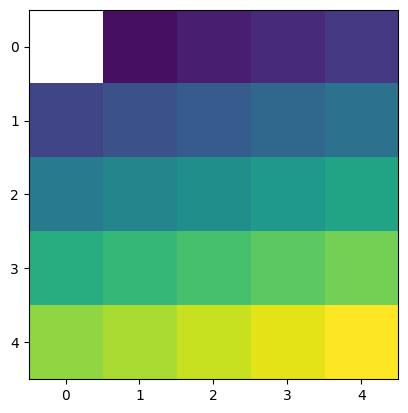

In [ ]:
my_cmap = matplotlib.cm.get_cmap('viridis')
my_cmap.set_under('w')
plt.imshow(np.arange(25).reshape(5, 5),
       interpolation='none',
       cmap=my_cmap,
       vmin=.001)

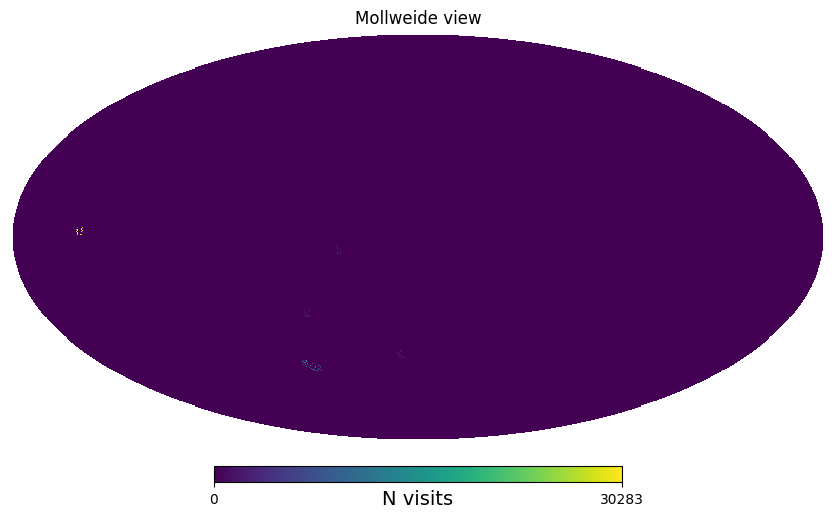

In [ ]:

plot_hp_rep(sample_DD)

In [ ]:
sample_WFD = sample_survey(WFD_hp_rep,20000)
sample_WFD

,ipix,hp_ra,hp_dec,n_visits
0,606935,1.319223,-0.575520,257
1,453350,1.411262,-0.154257,263
2,614897,6.194214,-0.597406,251
3,427584,0.395767,-0.088658,275
4,468818,2.077010,-0.193921,254
...,...,...,...,...
19995,476848,1.082990,-0.215199,259
19996,477922,1.386719,-0.217865,255
19997,613098,1.435806,-0.594260,270
19998,641760,1.374447,-0.685180,266


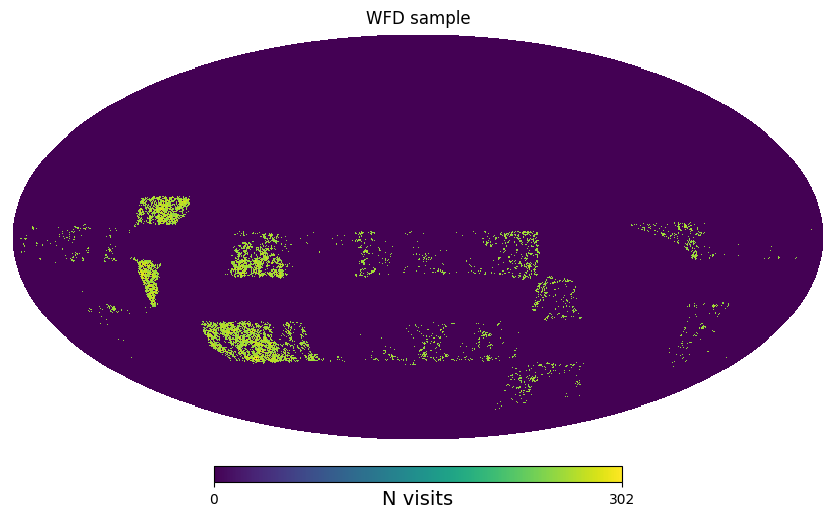

In [ ]:
plot_hp_rep(sample_WFD,title='WFD sample')
plt.savefig('WFD_hp')

In [ ]:
    def formatObs(OpSimObs, keep_keys=[]):
        """Format function to get quantities of interest for simulation.

        Parameters
        ----------
        OpSimObs : pandas.DataFrame
            Dataframe of OpSim output
        keep_keys : list(str)
            List of keys to keep in addition to formatted quantities

        Returns
        -------
        pandas.DataFrame
            Dataframe that contains quantities for simulation.

        Notes
        -----
        Quantities are obtained following arxiv:1905.02887

        Details of the calculs:

        The :math:`\sigma_\mathrm{PSF}` in units of :math:`\mathrm{arcsec}^{-1}` is obtained as

        .. math::
            \sigma_\mathrm{PSF} = \\frac{\mathbf{seeingFwhmEff}}{2\sqrt{2\ln2}}.

        The :math:`\mathbf{PSF}` is computed in units of :math:`\mathrm{pixel}^{-1}` as

        .. math::
            \mathbf{PSF} = \\frac{\sigma_\mathrm{PSF}}{\mathrm{PixelSize}},

        where :math:`\mathrm{PixelSize}` is the pixel size in :math:`\mathrm{arcsec}^{-1}`.

        The zero-point :math:`\mathbf{ZPT}` is computed as

        .. math::
            \mathbf{ZPT} = 2 m_5 - m_\mathrm{sky} + 2.5 \log\left[25 A \left(1 + A^{-1}10^{-0.4(m_5-m_\mathrm{sky})}\\right)\\right],

        where :math:`m_5 = \mathbf{fiveSigmaDepth}`, :math:`m_\mathrm{sky} = \mathbf{skyBrightness}` and :math:`A` is the noise equivalent area given by
        :math:`A = 4 \pi \sigma_\mathrm{PSF}^2`.

        The sky noise :math:`\mathbf{SKYSIG}` in unit of :math:`\mathrm{ADU}.\mathrm{pixel}^{-1}` is computed such as

        .. math::
            \mathbf{SKYSIG}^2 = 10^{-0.4\left(m_\mathrm{sky} - \mathbf{ZPT}\\right)} \\times \mathrm{PixelSize}^2.
        """
        sigPSF = OpSimObs["seeingFwhmEff"] / (2 * np.sqrt(2 * np.log(2)))

        # PSF in pixels^{-1}
        PSF = sigPSF / 0.2  # LSST Pixel size in arcsec^-1

        # Noise Effective Area in arcsec^{-2}
        NoiseArea = 4 * np.pi * sigPSF**2

        # ZPT
        dmag = OpSimObs["fiveSigmaDepth"] - OpSimObs["skyBrightness"]

        ZPT = 2 * OpSimObs["fiveSigmaDepth"] - OpSimObs["skyBrightness"]
        ZPT += 2.5 * np.log10(25 * NoiseArea)
        ZPT += 2.5 * np.log10(1 + 10 ** (-0.4 * dmag) / NoiseArea)

        # SKYSIG
        dskymag = OpSimObs["skyBrightness"] - ZPT
        SKYSIG = np.sqrt(10 ** (-0.4 * dskymag) * 0.2**2)

        formatobs_df = pd.DataFrame(
            {
                "expMJD": OpSimObs["observationStartMJD"],
                "PSF": PSF,
                "ZPT": ZPT,
                "SKYSIG": SKYSIG,
                "BAND": OpSimObs["filter"],
                **{k: OpSimObs[k] for k in keep_keys},
            }
        ).reset_index(names="ObsID")

        return formatobs_df


<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-604722666.py:22: SyntaxWarning: invalid escape sequence '\s'
  The :math:`\sigma_\mathrm{PSF}` in units of :math:`\mathrm{arcsec}^{-1}` is obtained as


In [ ]:
def get_obs_from_coords(tree,df, ra, dec, is_deg=True,formatobs=False, keep_keys=[]):
    """Get observations at ra, dec coordinates.

    Parameters
    ----------
    ra : numpy.ndarray(float)
        RA coordinate
    dec : numpy.ndarray(float)
        Dec coordinate
    is_deg : bool, optional
        is RA, Dec given in degrees, by default True
    formatobs : bool, optional
        format obs for simulation, by default False
    keep_keys : list(str)
        List of keys to keep in addition to formatted quantities

    Yields
    ------
    pandas.DatFrame
        Dataframes of observations.
    """
    if is_deg:
        ra = np.radians(ra)
        dec = np.radians(dec)

    obs_idx = tree.query_radius(
        np.array([dec, ra]).T,
        r=np.radians(1.75),
        count_only=False,
        return_distance=False,
    )
    for idx in obs_idx:
        if formatobs:
            yield formatObs(df.iloc[idx], keep_keys=keep_keys)
        else:
            yield df.iloc[idx]



In [ ]:
def get_survey_obs(tree, df, hp_rep, formatobs=True, keep_keys=[]):
    """Get survey observations.

    Parameters
    ----------
    formatobs : bool, optional
        Format the observation to get only quantities of interest for simulation, by default True
    keep_keys : list(str)
        List of keys to keep in addition to formatted quantities

    Yields
    ------
    pandas.DatFrame
        Dataframes of observations.
    """
    return get_obs_from_coords(
        tree, df, *hp_rep[["hp_ra", "hp_dec"]].values.T,
        is_deg=False,
        formatobs=formatobs,
        keep_keys=keep_keys,
    )

In [ ]:
def get_SIMLIB_doc(hp_rep,df,author_name,survey_hosts=None):
    """Give the DOCUMENTATION string for SIMLIB.

    Returns
    -------
    str
        DOCUMENTATION string
    """
    minMJD = df["observationStartMJD"].min()
    maxMJD = df["observationStartMJD"].max()
    date = datetime.datetime.now()
    OpSimFile = df.attrs["OpSimFile"]
    doc = "DOCUMENTATION:\n"
    doc += f"    PURPOSE: simulate LSST based on mock opsim version {OpSimFile}\n"
    doc += "    INTENT:   Nominal\n"
    doc += "    USAGE_KEY: SIMLIB_FILE\n"
    doc += "    USAGE_CODE: snlc_sim.exe\n"
    doc += "    VALIDATION_SCIENCE: \n"
    doc += "    NOTES: \n"
    doc += "        PARAMS MINMJD: {:.4f}\n".format(minMJD)
    doc += "        PARAMS MAXMJD: {:.4f}\n".format(maxMJD)
    doc += "        PARAMS TOTAL_AREA: {:.3f}\n".format(
        hp_rep.attrs["survey_area_deg"]
    )
    doc += "        PARAMS SOLID_ANGLE: {:.3f}\n".format(
        hp_rep.attrs["survey_area_rad"]
    )
    if survey_hosts is not None:
        doc += "        ASSOCIATED HOSTLIB: {}\n".format(
            out_path.with_suffix(".HOSTLIB").absolute()
        )
    doc += "    VERSIONS:\n"
    doc += f'    - DATE : {date.strftime(format="%Y-%m")}\n'
    doc += f"    AUTHORS : {author_name}, OpSimSummaryV2 version {opsim.__version__}\n"
    doc += "DOCUMENTATION_END:\n"
    return doc

In [ ]:
def get_SIMLIB_header(hp_rep, saturation_flag=1024, comments="\n"):
    """Give the SIMLIB header string.

    Parameters
    ----------
    saturation_flag : int, optional
        The flag corresponding to saturated obs, by default 1024
    comments : str, optional
        Comments to add to the header, by default '\\n'

    Returns
    -------
    str
        The SIMLIB header string.
    """
    try:
        user = os.getlogin()
    except:
        user = "NONE"
    try:
        host = os.getenv("HOSTNAME")
    except:
        host = "NONE"
    # comment: I would like to generalize ugrizY to a sort but am not sure
    # of the logic for other filter names. so ducking for now
    header = "\n\n\n"
    header += "SURVEY: LSST   FILTERS: ugrizY  TELESCOPE: LSST\n"
    header += "USER: {0:}     HOST: {1}\n".format(user, host)
    header += f"NLIBID: {len(hp_rep)}\n"
    header += "NPE_PIXEL_SATURATE:   100000\n"
    header += f"PHOTFLAG_SATURATE:    {saturation_flag}\n"
    header += comments + "\n"
    header += "BEGIN LIBGEN\n"
    return header

In [ ]:
def LIBheader(LIBID, ra, dec,df, mwebv=0.0, groupID=None):
    """Give the string of the header of a LIB entry.

    Parameters
    ----------
    LIBID : int
        The LIBID of the entry.
    ra : float
        RA [deg] coordinate of the entry
    dec : float
        Dec [deg] coordinate of the entry
    opsimdf : pandas.DataFrame
        LIB entry observations
    mwebv: float, optional
        MWEBV of the entry, default = 0.0
    groupID : int, optional
        GROUPID of the entry used to match with HOSTLIB hosts.

    Returns
    -------
    str
        The LIB entry header string.
    """
    nobs = len(df)
    # String formatting
    s = "# --------------------------------------------" + "\n"
    s += "LIBID: {0:10d}".format(LIBID) + "\n"
    tmp = "RA: {0:+10.6f} DEC: {1:+10.6f}   NOBS: {2:10d} MWEBV: {3:5.2f}"
    tmp += " PIXSIZE: {4:5.3f}"
    s += (
        tmp.format(ra, dec, nobs, mwebv, 0.2) + "\n"
    )
    if groupID is not None:
        s += f"HOSTLIB_GROUPID: {groupID}" + "\n"
    s += "#                           CCD  CCD         PSF1 PSF2 PSF2/1" + "\n"
    s += (
        "#     MJD      ID*NEXPOSE  FLT GAIN NOISE SKYSIG (pixels)  RATIO  ZPTAVG ZPTERR  MAG"
        + "\n"
    )
    return s

In [ ]:
ZPTNoise=0.005
CCDgain=1.0
CCDnoise=0.25
def init_dataline():
    f = lambda expMJD, ObsID, BAND, SKYSIG, PSF, ZPT: ut.dataline(
        expMJD,
        ObsID,
        BAND,
        CCDgain,
        CCDnoise,
        SKYSIG,
        PSF,
        ZPT,
        ZPTNoise,
    )

    return np.vectorize(f)

dataline = init_dataline()

In [ ]:
def LIBdata(opsimdf):
    """Give the string of a LIB entry.

    Parameters
    ----------
    opsimdf : pandas.DataFrame
        LIB entry observations

    Returns
    -------
    str
        The str of the LIB entry.
    """
    opsimdf["BAND"] = opsimdf["BAND"].map(lambda x: x.upper() if x == "y" else x)
    lib = "\n".join(
        dataline(
            opsimdf["expMJD"].values,
            opsimdf["ObsID"].values,
            opsimdf["BAND"].values,
            opsimdf["SKYSIG"].values,
            opsimdf["PSF"].values,
            opsimdf["ZPT"].values,
        )
    )
    return lib + "\n"

In [ ]:
def LIBfooter(LIBID):
    """Give the string of a LIB entry footer.

    Parameters
    ----------
    LIBID : int
        The LIBID of the entry

    Returns
    -------
    str
        The string of a LIB entry footer
    """
    footer = "END_LIBID: {0:10d}".format(LIBID)
    footer += "\n"
    return footer


In [ ]:
def get_SIMLIB_footer(hp_rep):
    """Give SIMLIB footer."""
    s = "END_OF_SIMLIB:    {0:10d} ENTRIES".format(
        hp_rep.attrs["N_fields"]
    )
    return s

In [ ]:
def write_SIMLIB(tree, hp_rep,df,out_path,author_name,survey_hosts=None, write_batch_size=10, buffer_size=8192):
    """write the SIMLIB (and the HOSTLIB) file(s).

    Parameters
    ----------
    write_batch_size : int
        Number of LIBID to write at the same time
    buffer_size : int
        buffering option for open() function
    """
    tstart = time.time()
    print(f"Writing SIMLIB in {out_path}")

    with open(out_path, "w", buffering=buffer_size) as simlib_file:
        simlib_file.write(get_SIMLIB_doc(hp_rep,df,author_name))
        simlib_file.write(get_SIMLIB_header(hp_rep))

        bcount = 0
        simlibstr = ""
        for (i, field), obs in zip(
            hp_rep.iterrows(), get_survey_obs(tree, df, hp_rep)
        ):
            LIBID = i
            RA = np.degrees(field.hp_ra)
            DEC = np.degrees(field.hp_dec)
            if survey_hosts is not None:
                groupID = LIBID
            else:
                groupID = None

            simlibstr += LIBheader(LIBID, RA, DEC, obs, groupID=groupID)
            simlibstr += LIBdata(obs)
            simlibstr += LIBfooter(LIBID)

            if not bcount % write_batch_size:
                simlib_file.write(simlibstr)
                simlibstr = ""

            bcount += 1

        simlib_file.write(simlibstr)
        simlib_file.write(get_SIMLIB_footer(hp_rep))

    print(f"SIMLIB wrote in {time.time() - tstart:.2f} sec.\n")


In [ ]:
os.getcwd()+'/DD_SIMLIB.SIMLIB'

'/content/DD_SIMLIB.SIMLIB'

In [ ]:
out_path_DD = os.getcwd()+'/DD_SIMLIB.SIMLIB'
out_path_WFD = os.getcwd()+'/WFD_SIMLIB.SIMLIB'

In [ ]:
write_SIMLIB(DD_tree,sample_DD,df_DD, out_path=out_path_DD, author_name='Mauricio Valenzuela C')

Writing SIMLIB in /content/DD_SIMLIB.SIMLIB
SIMLIB wrote in 23.49 sec.



In [ ]:
write_SIMLIB(WFD_tree,sample_WFD,df_WFD, out_path=out_path_WFD, author_name='Mauricio Valenzuela C')

Writing SIMLIB in /content/WFD_SIMLIB.SIMLIB
SIMLIB wrote in 130.10 sec.



In [ ]:
from google.colab import files

files.download('DD_SIMLIB.SIMLIB')
files.download('WFD_SIMLIB.SIMLIB')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>